In [112]:
from skimage.io import imread, imshow, imsave
from skimage import img_as_float, img_as_ubyte, exposure, color
import numpy as np
import matplotlib.pyplot as plt

In [17]:
def disp(img: np.ndarray, figsize: tuple = (10, 10)):
    plt.figure(figsize = figsize)
    imshow(img)

In [8]:
imgs = []
for i in range(1, 16):
    imgs.append(imread(f'{i}.jpg'))

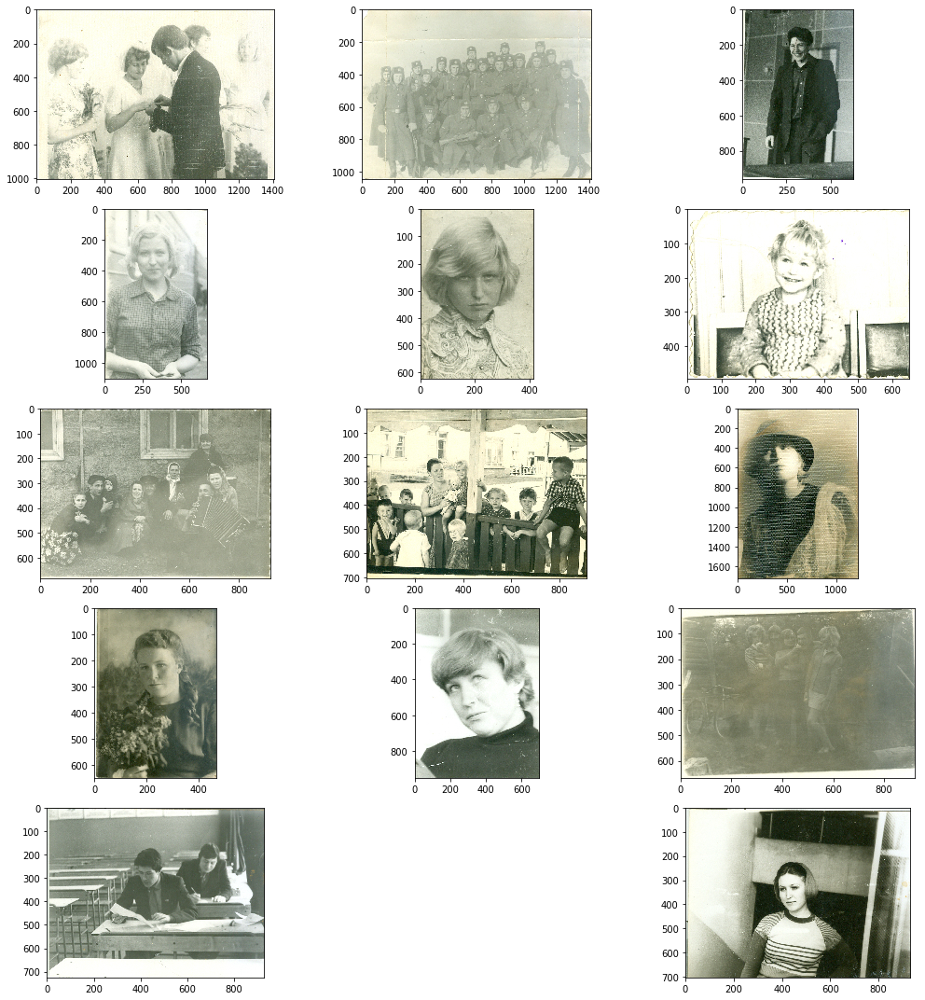

In [20]:
plt.figure(figsize = (15, 15))
for i in range(1, 16):
    plt.subplot(5, 3, i)
    imshow(imgs[i - 1])

In [62]:
def add_to_img(img: np.ndarray, size: tuple = (1, 1)) -> np.ndarray:
    """
    Возвращает новое изображение с добавленными пикселями по краям
    img - изображение
    size - tuple с двумя значениями: size[0] - кол-во пикселей, которое нужно добавить по высоте, size[1] - по ширине
    """
    wide = add_width_to_img(img, size[1]) if size[1] > 0 else img.copy()
    tall = add_height_to_img(wide, size[0]) if size[0] > 0 else wide
    return tall

def add_width_to_img(img: np.ndarray, w: int) -> np.ndarray:
    """
    Возвращает новое изображение с добавленными пикселями по краям по ширине
    img - изображение
    w - количество пикселей, которое нужно добавить с каждой стороны
    """
    new_w = img.shape[1] + w * 2
    shape = (img.shape[0], new_w, img.shape[2]) if is_colorful(img) else (img.shape[0], new_w)
    res = np.zeros(shape, dtype = img.dtype)
    res[:,w : -w] = img
    
    for i in range(w - 1, -1, -1):
        for j in range(res.shape[0]):
            k = res.shape[1] - i - 1
            
            t = max(0, j - 1)
            b = min(res.shape[0], j + 1)
                
            res[j, i] = np.mean(res[t : b + 1, i + 1], axis = 0, dtype = 'uint')
            res[j, k] = np.mean(res[t : b + 1, k - 1], axis = 0, dtype = 'uint')
    return res

def add_height_to_img(img: np.ndarray, h: int) -> np.ndarray:
    """
    Возвращает новое изображение с добавленными пикселями по краям по высоте
    img - изображение
    h - количество пикселей, которое нужно добавить с каждой стороны
    """
    new_h = img.shape[0] + h * 2
    shape = (new_h, img.shape[1], img.shape[2]) if is_colorful(img) else (new_h, img.shape[1])
    res = np.zeros(shape, dtype = img.dtype)
    res[h : -h,:] = img
    
    for i in range(h - 1, -1, -1):
        for j in range(res.shape[1]):
            k = res.shape[0] - i - 1
            
            l = max(0, j - 1)
            r = min(res.shape[1], j + 1)
                
            res[i, j] = np.mean(res[i + 1, l : r + 1], axis = 0, dtype = 'uint')
            res[k, j] = np.mean(res[k - 1, l : r + 1], axis = 0, dtype = 'uint')
    return res

def is_colorful(img: np.ndarray) -> bool:
    return len(img.shape) == 3 and img.shape[2] == 3

In [181]:
def median_filter(img: np.ndarray, size: tuple) -> np.ndarray:
    """
    Возвращает новое изображение, размытое медианным фильтром
    img - изображение
    size - размеры окна размытия, высота х ширина
    """
    res = np.zeros(img.shape, img.dtype)
    a, b = size[0] // 2, size[1] // 2
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            u = max(0, i - a)
            d = min(img.shape[0] - 1, i + a)
            l = max(0, j - b)
            r = min(img.shape[1] - 1, j + b)
            res[i, j] = np.median(img[u : d + 1, l : r + 1], (0, 1)).astype(img.dtype)
    return res

In [59]:
def filter_with_matrix(img: np.ndarray, mtx: np.ndarray, coeff = 1) -> np.ndarray:
    """
    Возвращает новое изображение, отфильтрованное матрицей
    Каждый пиксель нового изображения равен сумме произведений элементов матрицы на соответствующие им пиксели,
    умноженной на коэффициент
    img - изображение
    mtx - матрица
    coeff - коэффициент, на который надо домножить каждую сумму
    """
    off = mtx.shape[0] // 2
    # дополняем изображение по краям, чтобы провести фильтрацию по всему изображению
    res = add_to_img(img, (off, off))
    # разные функции для монохромных и цветных изображений
    if is_colorful(res):
        res = filter_colorful(res, mtx, off, coeff)
    else:
        res = filter_gray(res, mtx, off, coeff)
    # возвращаем результат без дополнения по краям
    return res[off: res.shape[0] - off, off: res.shape[1] - off]

def filter_colorful(img: np.ndarray, mtx: np.ndarray, off: int, coeff: int) -> np.ndarray:
    res = img.copy()
    for i in range(off, res.shape[0] - off):
        for j in range(off, res.shape[1] - off):
            for c in range(res.shape[2]):
                res[i, j, c] = coeff * np.sum(mtx * img[i - off : i + off + 1, j - off : j + off + 1, c])
    return res
                
def filter_gray(img: np.ndarray, mtx: np.ndarray, off: int, coeff: int) -> np.ndarray:
    res = img.copy()
    for i in range(off, res.shape[0] - off):
        for j in range(off, res.shape[1] - off):
            res[i, j] = coeff * np.sum(mtx * img[i - off : i + off + 1, j - off : j + off + 1])
    return res

In [60]:
def get_gaussian_mtx(sigma: float, size = 1) -> np.ndarray:
    """
    Возвращает матрицу размытия по закону Гауссовского распределения заданного размера для заданного ср. кв. откл.
    sigma - среднеквадратичное отклонение матрицы
    size - размер квадратной матрицы
    """
    off = size // 2
    div = 2 * sigma ** 2
    mtx = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            # переводим координаты i, j в смещение относительно центрального элемента
            u, v = i - off, j - off
            mtx[i, j] = np.exp(-(u ** 2 + v ** 2) / div)
    return mtx

def gaussian_blur(img: np.ndarray, sigma: float, size = 1) -> np.ndarray:
    """
    Возвращает изображение, размытое по Гауссу
    img - изображение
    sigma - среднеквадратичное отклонение распределения
    size - размер матрицы распределения
    """
    div = 1 / (2 * np.pi * sigma ** 2)
    mtx = get_gaussian_mtx(sigma, size)
    return filter_with_matrix(img, mtx, div)

In [261]:
def grey_slice(img, thres = 128):
    res = img.copy()
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            res[i, j] = res[i, j] if res[i, j] >= thres else 0
    return res

In [149]:
def autocontrast_grey(img):
    contrast = img.astype('float')
    xmin, xmax = get_min_max_g(contrast)
    for i in range(contrast.shape[0]):
        for j in range(contrast.shape[1]):
            contrast[i, j] = calc_contrast_g(contrast[i, j], xmin, xmax)
    return np.clip(contrast, 0, 255).astype('uint8')

def calc_contrast_g(x, xmin, xmax):
    return (x - xmin) * 255 / (xmax - xmin)

def get_min_max_g(img):
    sorted_pxs = np.sort(img.flatten())
    k = round(sorted_pxs.shape[0] * .05)
    return sorted_pxs[k + 1], sorted_pxs[sorted_pxs.shape[0] - k - 2]

In [115]:
def autocontrast(img):
    contr = rgb2yuv(img)
    ymin, ymax = get_min_max(contr)
    contr[:, :, 0] = calc_contrast(contr[:, :, 0], ymin, ymax)
    return yuv2rgb(contr)

calc_contrast = lambda y, ymin, ymax: (y - ymin) / (ymax - ymin)

def get_min_max(img):
    sorted_pxs = np.sort(img.flatten()[::3])
    k = round(sorted_pxs.shape[0] * .05)
    return sorted_pxs[k + 1], sorted_pxs[sorted_pxs.shape[0] - k - 2]

def rgb2yuv(img):
    yuv = img / 255
    r, g, b = yuv[:, :, 0].copy(), yuv[:, :, 1].copy(), yuv[:, :, 2].copy()
    yuv[:, :, 0] = .2126 * r + .7152 * g + .0722 * b
    yuv[:, :, 1] = -.0999 * r - .336 * g + .436 * b
    yuv[:, :, 2] = .615 * r - .5586 * g - .0563 * b
    return yuv

def yuv2rgb(img):
    rgb = img.copy()
    y, u, v = img[:, :, 0], img[:, :, 1], img[:, :, 2]
    rgb[:, :, 0] = y + 1.2803 * v
    rgb[:, :, 1] = y - .2148 * u - .3805 * v
    rgb[:, :, 2] = y + 2.1279 * u
    return np.clip(rgb, 0, 1)

In [131]:
__grey_mult__ = np.array([.2989, .587, .114])

def rgb2grey(img: np.ndarray) -> np.ndarray:
    """Возвращает изображение, являющейся монохромной копией исходного цветного"""
    # Каждый пиксель монохромного изображения является
    # скалярным произведением вектора значений rgb исходного пикселя и вектора коэффициентов
    return (img[:,:] @ __grey_mult__).astype('uint8')

In [136]:
def equalize(img):
    cdf = get_cdf(img)
    cdf_min = get_cdf_min(cdf)
    cnt = img.shape[0] * img.shape[1]

    res = img.copy()
    for i in range(res.shape[0]):
        for j in range(res.shape[1]):
            res[i, j] = transf(res[i, j], cdf, cdf_min, cnt)
    return res

def get_cdf(img):
    flat = img.flatten()
    cdf = {0: flat[flat == 0].shape[0]}
    for i in range(1, 256):
        cdf[i] = cdf[i - 1] + flat[flat == i].shape[0]
    return cdf
    
def get_cdf_min(cdf):
    for i in cdf:
        if cdf[i] > 0:
            return cdf[i]
        
def transf(x, cdf, cdf_min, cnt):
    return round((cdf[x] - cdf_min) * 255 / (cnt - 1))

In [232]:
# orig = imgs[14][17:, 15:]
orig = imgs[8][21:,:1207]

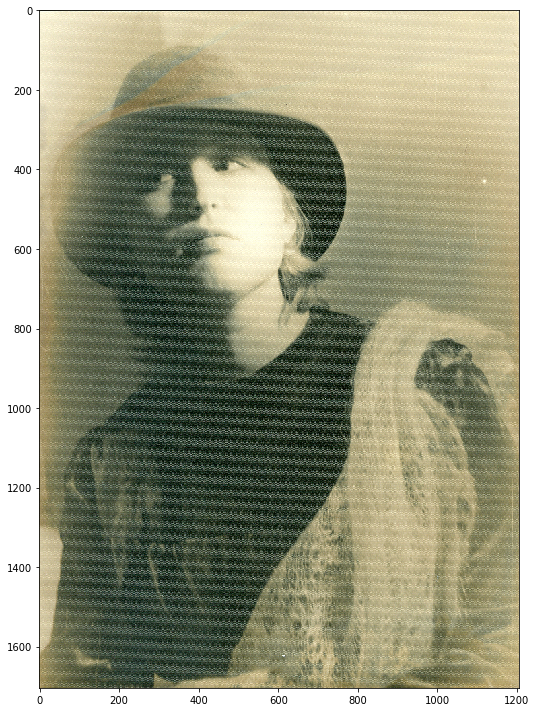

In [233]:
disp(orig)

In [234]:
greyed = rgb2grey(orig)

In [235]:
greyed_eq = equalize(greyed)

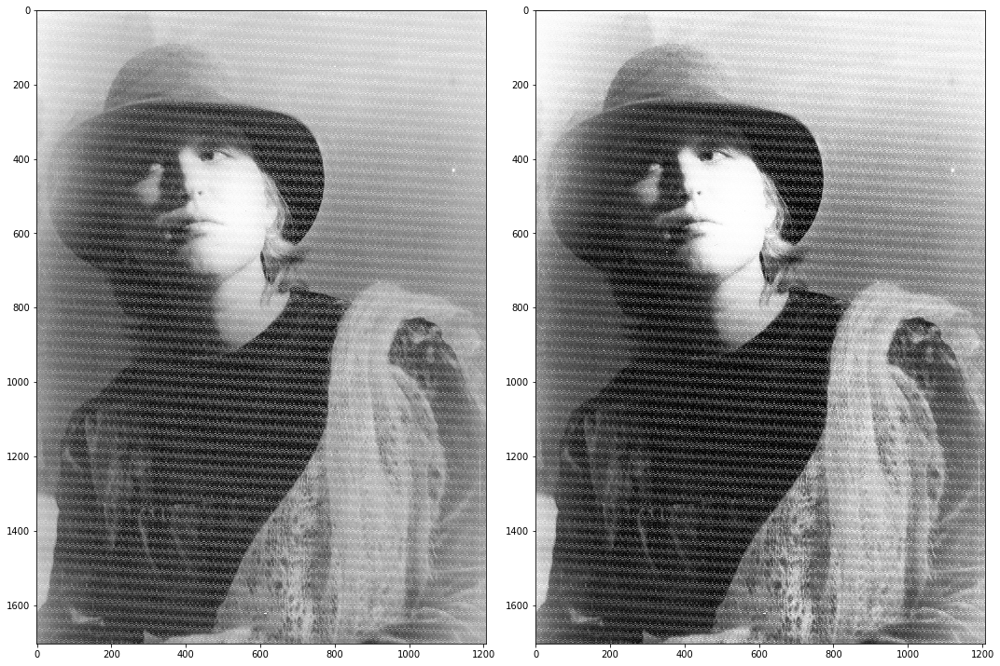

In [236]:
plt.figure(figsize = (15, 15))
plt.subplot(1, 2, 1)
imshow(greyed)
plt.subplot(1, 2, 2)
imshow(greyed_eq)

In [243]:
greyed_eq_blur = gaussian_blur(greyed_eq, 1.5, 3)
# greyed_eq_blur = gaussian_blur(greyed, 3, 9)
# greyed_eq_blur = median_filter(greyed_eq, (15, 15))

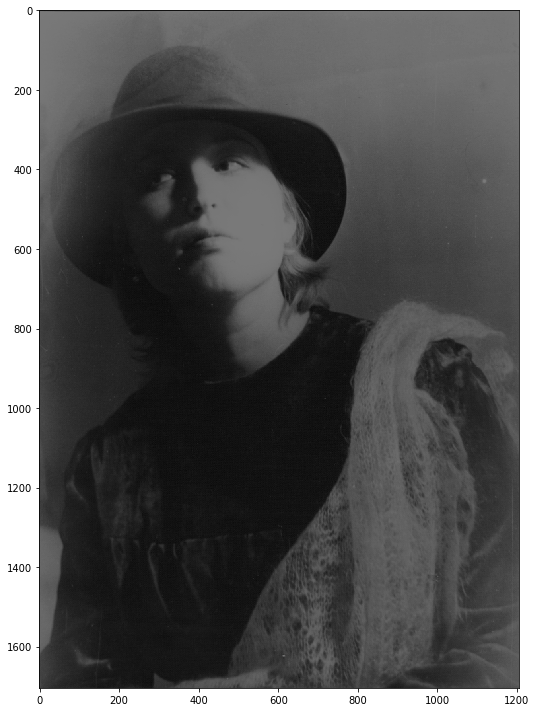

In [244]:
disp(greyed_eq_blur)

In [245]:
greyed_eq_blur_ac = autocontrast_grey(greyed_eq_blur)

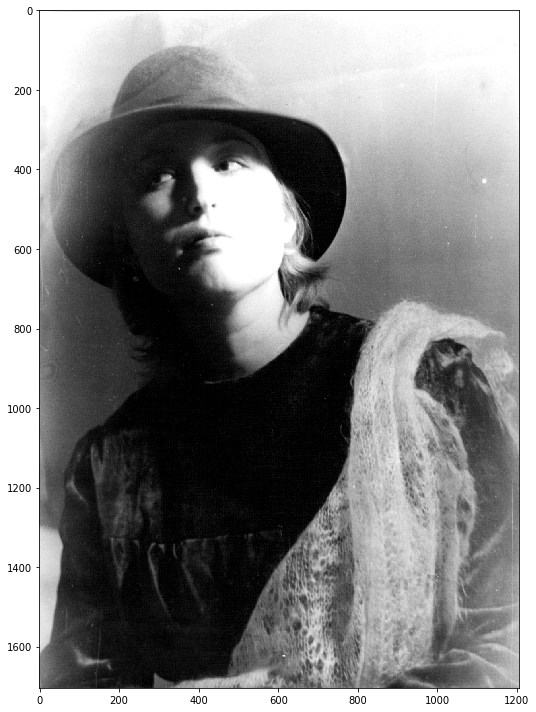

In [246]:
disp(greyed_eq_blur_ac)

In [267]:
orig = imgs[14][17:, 15:]

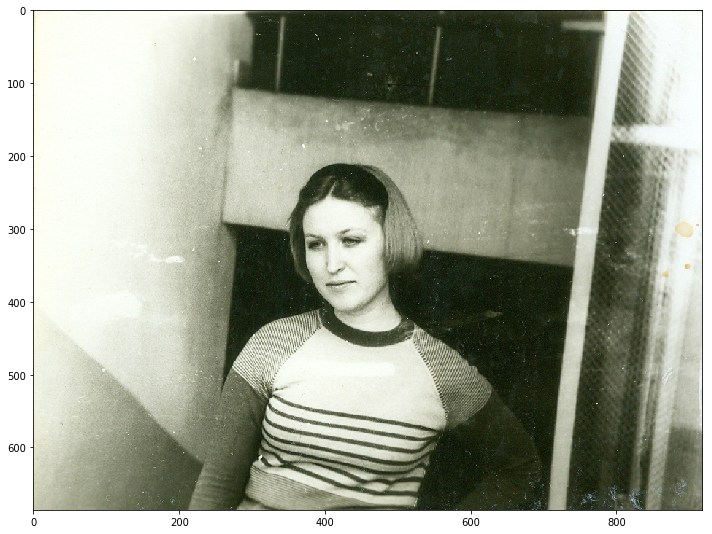

In [268]:
disp(orig)

In [269]:
greyed = rgb2grey(orig)

In [270]:
greyed_eq = equalize(greyed)

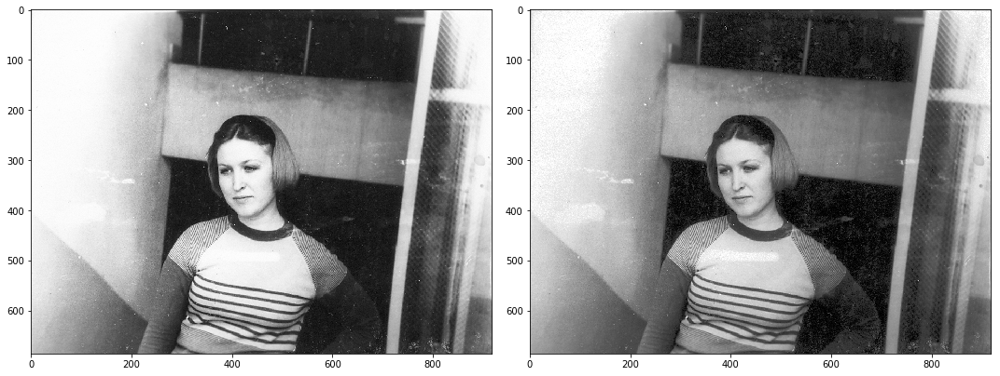

In [271]:
plt.figure(figsize = (15, 15))
plt.subplot(1, 2, 1)
imshow(greyed)
plt.subplot(1, 2, 2)
imshow(greyed_eq)

In [272]:
greyed_eq_blur = gaussian_blur(greyed, 3, 9)

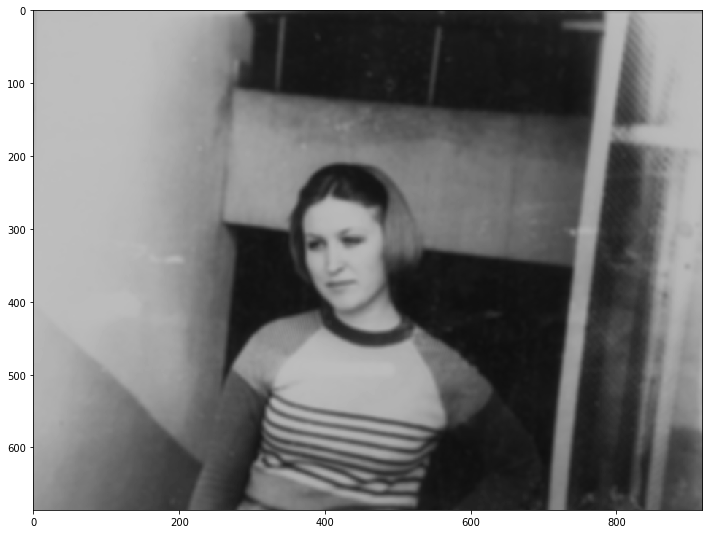

In [273]:
disp(greyed_eq_blur)

In [274]:
greyed_eq_blur_ac = autocontrast_grey(greyed_eq_blur)

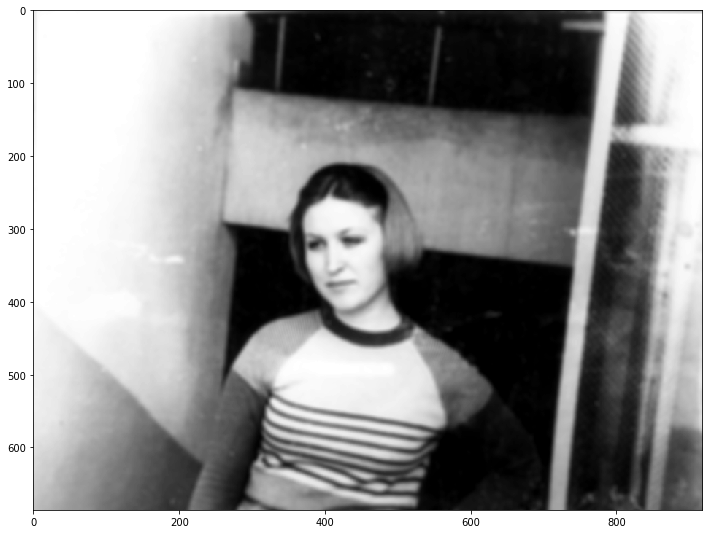

In [275]:
disp(greyed_eq_blur_ac)

In [276]:
greyed_eq_med = median_filter(greyed_eq, (15, 15))

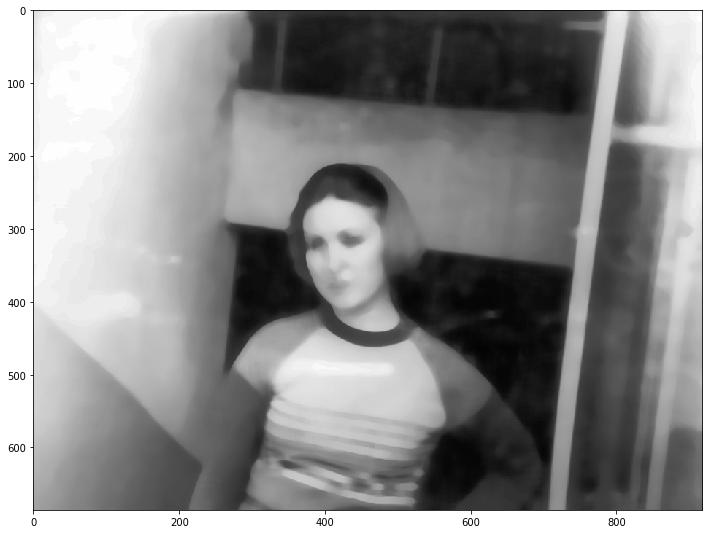

In [277]:
disp(greyed_eq_med)

In [278]:
greyed_eq_med_ac = autocontrast_grey(greyed_eq_med)

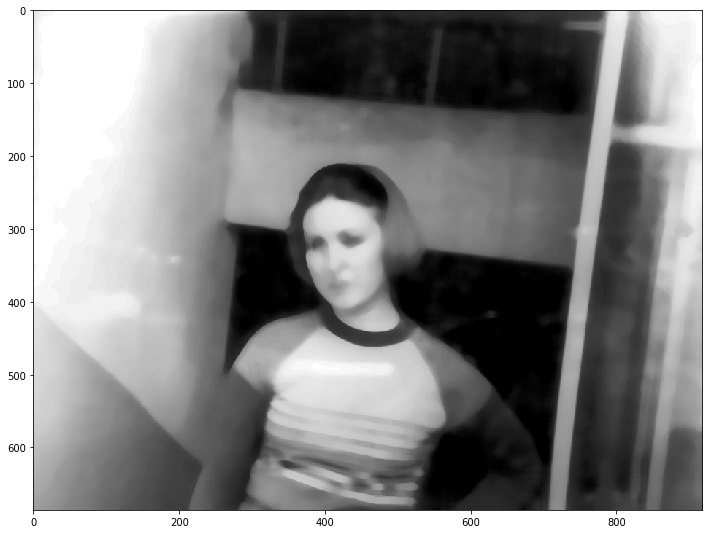

In [279]:
disp(greyed_eq_med_ac)

In [201]:
tst2 = greyed_eq.copy()
tst2[300:430, 50:220] = greyed_eq_med_ac[300:430, 50:220]

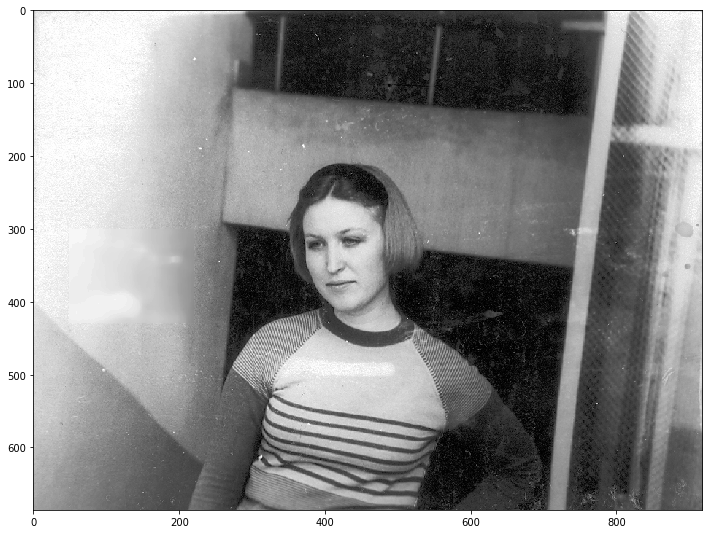

In [202]:
disp(tst2)

In [298]:
orig = imgs[0][5:, 68:1370]

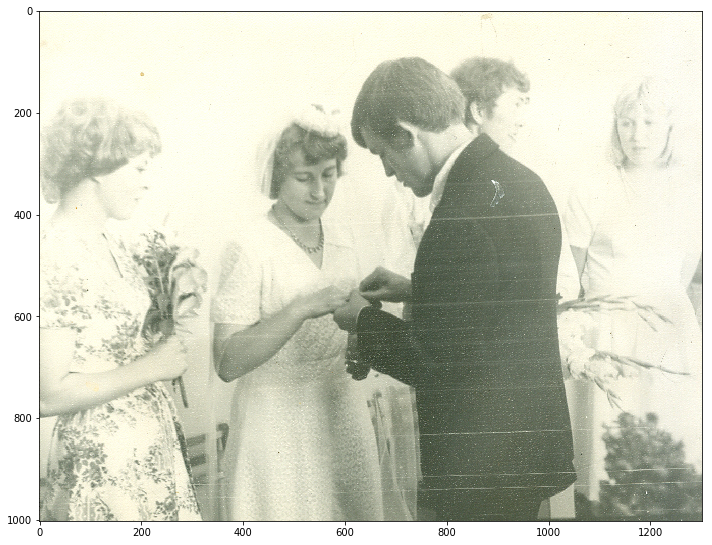

In [299]:
disp(orig)

In [300]:
greyed = rgb2grey(orig)

In [301]:
greyed_eq = equalize(greyed)

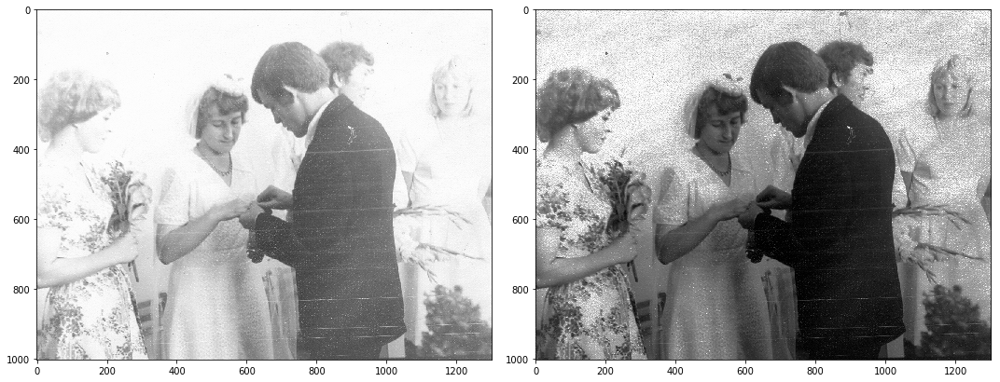

In [303]:
plt.figure(figsize = (15, 15))
plt.subplot(1, 2, 1)
imshow(greyed)
plt.subplot(1, 2, 2)
imshow(greyed_eq)

In [324]:
greyed_eq_blur = gaussian_blur(greyed_eq, 5, 5)

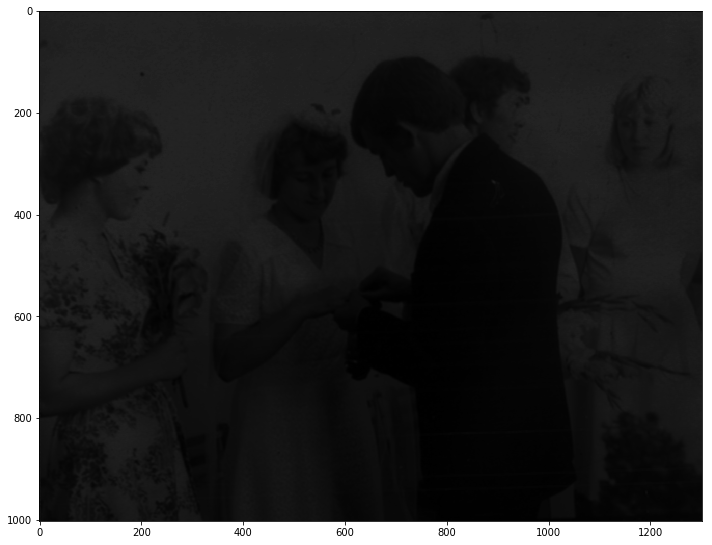

In [325]:
disp(greyed_eq_blur)

In [326]:
greyed_eq_blur_ac = autocontrast_grey(greyed_eq_blur)

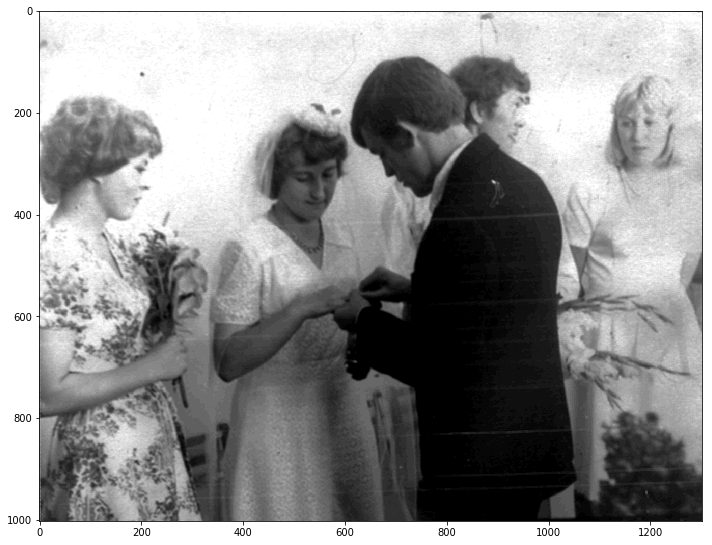

In [327]:
disp(greyed_eq_blur_ac)

In [332]:
greyed_eq_blur = gaussian_blur(greyed_eq, 2, 5)

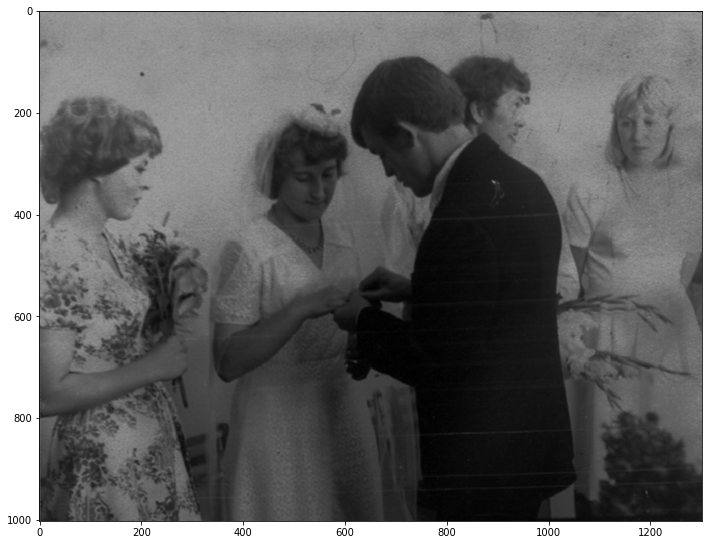

In [333]:
disp(greyed_eq_blur)

In [334]:
greyed_eq_blur_ac = autocontrast_grey(greyed_eq_blur)

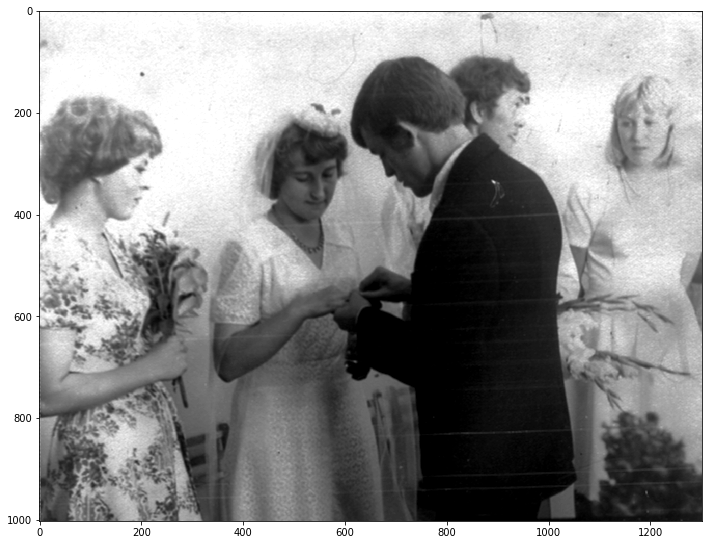

In [335]:
disp(greyed_eq_blur_ac)

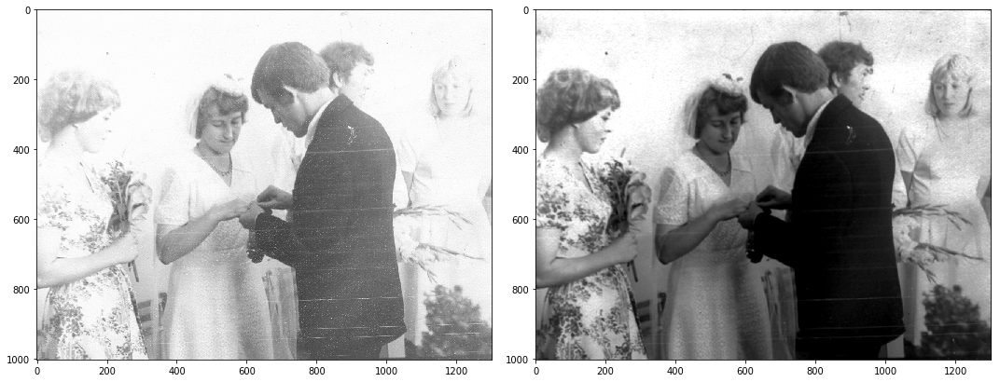

In [336]:
plt.figure(figsize = (15, 15))
plt.subplot(1, 2, 1)
imshow(greyed)
plt.subplot(1, 2, 2)
imshow(greyed_eq_blur_ac)